<a href="https://colab.research.google.com/github/ChengyangHuang/DynamicSemanticMapping/blob/master/Optical_Flow_Estimator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Setup


## Downlowd Data


In [12]:
import os
os.chdir('/content')
if not os.path.exists('KITTI_15.zip'):
    !wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1dIHRrsA7rZSRJ6M9Uz_75ZxcHHY96Gmb' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1dIHRrsA7rZSRJ6M9Uz_75ZxcHHY96Gmb" -O KITTI_15.zip && rm -rf /tmp/cookies.txt
    !unzip -q KITTI_15.zip -d KITTI_15

--2020-04-12 04:29:17--  https://docs.google.com/uc?export=download&confirm=ObyT&id=1dIHRrsA7rZSRJ6M9Uz_75ZxcHHY96Gmb
Resolving docs.google.com (docs.google.com)... 173.194.216.101, 173.194.216.139, 173.194.216.100, ...
Connecting to docs.google.com (docs.google.com)|173.194.216.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0g-3c-docs.googleusercontent.com/docs/securesc/2h1o1baquv82men0mlisnqcsnqtev067/h7jhs9ftimb9ost1cbafg5ljubrm0ire/1586665725000/13877028254653930819/18329711338470333901Z/1dIHRrsA7rZSRJ6M9Uz_75ZxcHHY96Gmb?e=download [following]
--2020-04-12 04:29:17--  https://doc-0g-3c-docs.googleusercontent.com/docs/securesc/2h1o1baquv82men0mlisnqcsnqtev067/h7jhs9ftimb9ost1cbafg5ljubrm0ire/1586665725000/13877028254653930819/18329711338470333901Z/1dIHRrsA7rZSRJ6M9Uz_75ZxcHHY96Gmb?e=download
Resolving doc-0g-3c-docs.googleusercontent.com (doc-0g-3c-docs.googleusercontent.com)... 173.194.217.132, 2607:f8b0:400c:c13::84
Conne

## Libraries

In [13]:
pip install flow_vis

In [0]:
import flow_vis
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

# from scipy import signal
# import imageio

# Dense Flow

## Gunner Farneback



In [0]:
def dense_GF(frame1, frame2, params=None, blur=True):
    if params is None:
        params = dict(pyr_scale = 0.5,
                      levels = 5,
                      winsize = 15,
                      iterations = 5, 
                      poly_n = 7, 
                      poly_sigma = 1.5,
                      flags = 0)
        
    prev_img = cv2.cvtColor(frame1,cv2.COLOR_BGR2GRAY)
    next_img = cv2.cvtColor(frame2,cv2.COLOR_BGR2GRAY)

    if blur:
        prev_img = cv2.GaussianBlur(prev_img,(5,5),0)
        next_img = cv2.GaussianBlur(next_img,(5,5),0)

    flow = cv2.calcOpticalFlowFarneback(prev_img,next_img, None, **params)
    flow_color = flow_vis.flow_to_color(flow, convert_to_bgr=False)

    return flow, flow_color

# Flow Visualization


## Helper function

In [0]:
def plot_imgs(img1, img2, flow_color, img_name):
    titles = [img_name+' Prev Image', 'Next Image', 'Optical Flow']
    fig, ax = plt.subplots(1, 3, figsize=(15, 20))
    for i, a in enumerate(ax):
      a.set_axis_off()
      a.set_title(titles[i])
    ax[0].imshow(cv2.cvtColor(img1,cv2.COLOR_BGR2RGB))
    ax[1].imshow(cv2.cvtColor(img2,cv2.COLOR_BGR2RGB))
    ax[2].imshow(flow_color)

def plot_all(img1, img2, flow_color, flow_target, img1_name):
    titles = [img1_name+'Prev Image', 'Next Image', 'CV2 Flow', 'GT Flow']
    fig, ax = plt.subplots(1, 4, figsize=(30, 20))
    for i, a in enumerate(ax):
      a.set_axis_off()
      a.set_title(titles[i])
    ax[0].imshow(cv2.cvtColor(img1,cv2.COLOR_BGR2RGB))
    ax[1].imshow(cv2.cvtColor(img2,cv2.COLOR_BGR2RGB))
    ax[2].imshow(flow_color)
    ax[3].imshow(flow_target)

## Dense GF

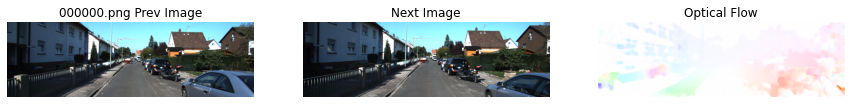

In [26]:
os.chdir('/content/KITTI_15/data_kitti_15/rgb_img/')

img1 = cv2.imread('000000.png')
img2 = cv2.imread('000001.png')

params = dict(pyr_scale = 0.5,
                levels = 5,
                winsize = 10, 
                iterations = 5, 
                poly_n = 7, 
                poly_sigma = 1.5,
                flags = 0)

flow, flow_color = dense_GF(img1, img2, params)
plot_imgs(img1, img2, flow_color, '000000.png')

In [20]:
from pathlib import Path
root = "/content/KITTI_15/data_kitti_15/"
image_folder = "rgb_img"

root = Path(root)
image_dir = root/image_folder

im = sorted([os.path.basename(x) for x in image_dir.glob("*.png")])

['000000.png', '000001.png', '000002.png', '000003.png', '000004.png', '000005.png', '000006.png', '000007.png', '000008.png', '000009.png', '000010.png', '000011.png', '000012.png', '000013.png', '000014.png', '000015.png', '000016.png', '000017.png', '000018.png', '000019.png', '000020.png', '000021.png', '000022.png', '000023.png', '000024.png', '000025.png', '000026.png', '000027.png', '000028.png', '000029.png', '000030.png', '000031.png', '000032.png', '000033.png', '000034.png', '000035.png', '000036.png', '000037.png', '000038.png', '000039.png', '000040.png', '000041.png', '000042.png', '000043.png', '000044.png', '000045.png', '000046.png', '000047.png', '000048.png', '000049.png', '000050.png', '000051.png', '000052.png', '000053.png', '000054.png', '000055.png', '000056.png', '000057.png', '000058.png', '000059.png', '000060.png', '000061.png', '000062.png', '000063.png', '000064.png', '000065.png', '000066.png', '000067.png', '000068.png', '000069.png', '000070.png', '0000

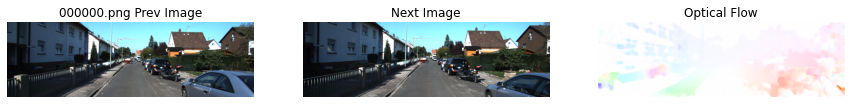

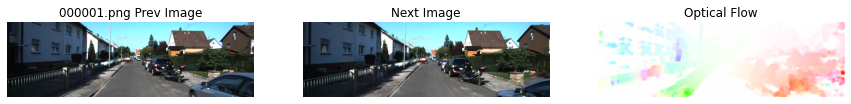

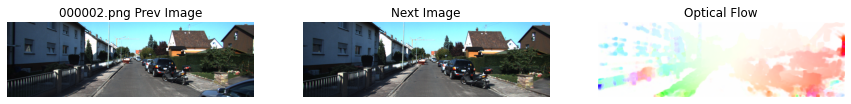

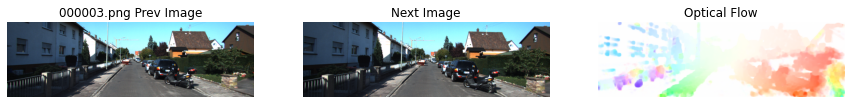

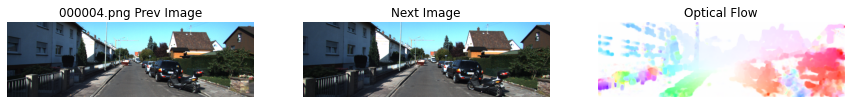

...

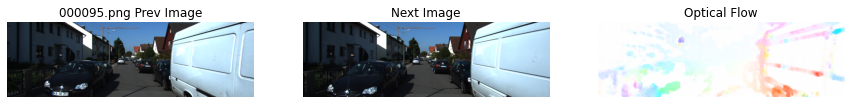

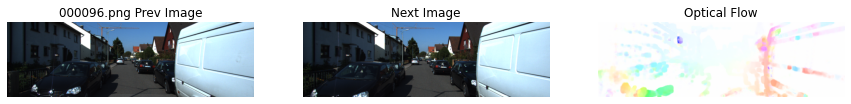

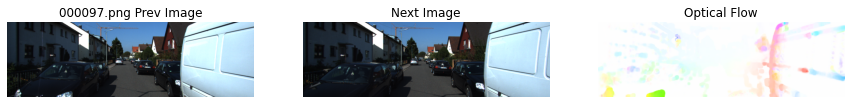

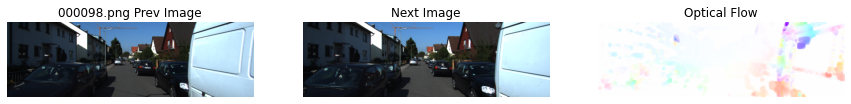

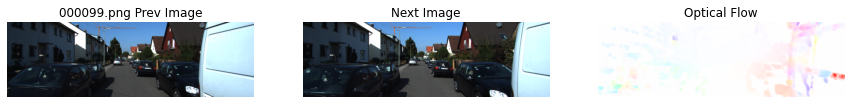

In [27]:
os.chdir('/content/KITTI_15/data_kitti_15/rgb_img/')

params = dict(pyr_scale = 0.5,
                levels = 5,
                winsize = 10, 
                iterations = 5, 
                poly_n = 7, 
                poly_sigma = 1.5,
                flags = 0)

img1 = cv2.imread(im[0])
for i in range(len(im)):
    if i == len(im)-1:
        break
    img2 = cv2.imread(im[i+1])

    flow, flow_color = dense_GF(img1, img2, params)
    plot_imgs(img1, img2, flow_color, im[i])
    plt.show()

    img1 = img2.copy()